# Example: Comparing different compression methods for specific humidity (`q`) and temperature (`t`)

**Note:** Any changes you make to this notebook will be lost once the page is closed or refreshed. Please download any files you would like to keep.

**Note:** The WASM-based version of the compression lab running inside JupyterLite has only been tested in recent Firefox browsers.

## Setting up the online laboratory

First, we import several utility packages to setup this notebook for data compression in climate science and meteorology.

Please refer back to the [intro.ipynb](intro.ipynb) notebook for a deeper explanation.

In [1]:
from pathlib import Path

import dask
import fcbench
import numpy as np
import pandas as pd
import xarray as xr

import utils


fcbench.codecs.preload()

dask.config.set(array__chunk_size="32MiB");

[pyodide]: Loading zarr, asciitree, numcodecs, msgpack, kerchunk, fsspec, ujson, cftime, xarray, pandas, tzdata, h5py, pkgconfig, cfgrib, attrs, click, eccodes, cffi, pycparser, findlibs, scipy, openblas, field-compression-benchmark, dask, cloudpickle, importlib_metadata, zipp, Jinja2, MarkupSafe, partd, locket, toolz, pyyaml, netcdf4, pint, typing-extensions, xeofs, pooch, lzma, platformdirs, scikit-learn, joblib, distutils, threadpoolctl, statsmodels, patsy, tqdm, xarray-datatree, xhistogram, ipyfilite, ipywidgets, widgetsnbextension, jupyterlab_widgets, sympy, mpmath
[pyodide]: Loaded Jinja2, MarkupSafe, asciitree, attrs, cffi, cfgrib, cftime, click, cloudpickle, dask, distutils, eccodes, field-compression-benchmark, findlibs, fsspec, h5py, importlib_metadata, ipyfilite, ipywidgets, joblib, jupyterlab_widgets, kerchunk, locket, lzma, mpmath, msgpack, netcdf4, numcodecs, openblas, pandas, partd, patsy, pint, pkgconfig, platformdirs, pooch, pycparser, pyyaml, scikit-learn, scipy, stat

## Retrieving and loading the dataset

First, we look at temperature and specific humidity from the global ensemble forecast dataset TIGGE, which we retrieve with the following MARS request:

```
retrieve,
dataset=tigge,
date=2024-08-02,
expver=prod,
grid=2/2,
levtype=pl,
levelist=1000,
model=glob,
origin=ecmwf,
param=130/133,
step=240,
time=00:00:00,
type=fc,
format=netcdf,
target="tigge_pl_t_q_dx=2_2024_08_02.nc"
```

### Option 1: Retrieve the data using the `ecmwfapi`

If you have an API key from https://api.ecmwf.int/v1/key/, you can use the `ecmwfapi` to download the dataset directly from MARS by uncommenting the following code:

In [2]:
from ecmwfapi import ECMWFDataServer

if False:  # toggle to use the ecmwfapi
    server = ECMWFDataServer(**{
        "url"   : "<ECMWF-API-URL>",
        "key"   : "<ECMWF-API-KEY>",
        "email" : "<ECMWF-API-EMAIL>"
    })
    
    server.retrieve(
        {
            "dataset": "tigge",
            "date": "2024-08-02",
            "expver": "prod",
            "grid": "2/2",
            "levtype": "pl",
            "levelist": "1000",
            "model": "glob",
            "origin": "ecmwf",
            "param": "130/133",
            "step": "240",
            "time": "00:00:00",
            "type": "fc",
            "format" : "netcdf",
            "target": "tigge_pl_t_q_dx=2_2024_08_02.nc",
        }
    )

[pyodide]: Loading ecmwf-api-client
[pyodide]: Loaded ecmwf-api-client


### Option 2: Download this dataset from an S3 bucket

If you cannot access the dataset with the `ecmwfapi`, you can also download it from <https://a3s.fi/compression.lab.climet.eu/tigge_pl_t_q_dx=2_2024_08_02.nc>:

In [3]:
import shutil
from urllib.parse import unquote as urlunquote
from urllib.parse import urlparse
from urllib.request import urlopen

download_url = "https://a3s.fi/compression.lab.climet.eu/tigge_pl_t_q_dx=2_2024_08_02.nc"
download_path = Path(urlunquote(Path(urlparse(download_url).path).name))

if not download_path.exists():
    with urlopen(download_url) as response:
        with download_path.open("wb") as file:
            shutil.copyfileobj(response, file)

Finally, we can load the dataset using `xarray`.

In [4]:
ds = utils.open_dataset(download_path)
ds

<xarray.Dataset>
Dimensions:    (longitude: 180, latitude: 91, time: 1)
Coordinates:
  * longitude  (longitude) float32 0.0 2.0 4.0 6.0 ... 352.0 354.0 356.0 358.0
  * latitude   (latitude) float32 90.0 88.0 86.0 84.0 ... -86.0 -88.0 -90.0
  * time       (time) datetime64[ns] 2024-08-12
Data variables:
    t          (time, latitude, longitude) float32 dask.array<chunksize=(1, 91, 180), meta=np.ndarray>
    q          (time, latitude, longitude) float32 dask.array<chunksize=(1, 91, 180), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      2024-09-27 11:51:26 GMT by grib_to_netcdf-2.35.3: /opt/ecmw...
    path:         tigge_pl_t_q_dx=2_2024_08_02.nc

## Plot the loaded dataset

In [5]:
import earthkit

[pyodide]: Loading earthkit, earthkit-data, entrypoints, filelock, jsonschema, pyrsistent, markdown, multiurl, pdbufr, earthkit-meteo, earthkit-geo, pyproj, earthkit-maps, Cartopy, shapely, pyshp, geos, adjustText, earthkit-plots, earthkit-plots-default-styles, earthkit-regrid, earthkit-transforms, geopandas, fiona, setuptools, cligj, rasterio, affine, gdal, click-plugins
[pyodide]: Loaded Cartopy, adjustText, affine, click-plugins, cligj, earthkit, earthkit-data, earthkit-geo, earthkit-maps, earthkit-meteo, earthkit-plots, earthkit-plots-default-styles, earthkit-regrid, earthkit-transforms, entrypoints, filelock, fiona, gdal, geopandas, geos, jsonschema, markdown, multiurl, pdbufr, pyproj, pyrsistent, pyshp, rasterio, setuptools, shapely


/lib/python3.11/site-packages/earthkit/regrid/utils/caching.py:27: UserWarning: only soft file lock is available
  from filelock import FileLock


We first plot the loaded dataset. `earthkit` provides the
```python
earthkit.maps.quickplot(
    *data, blueprint=..., units=None, style=None, disjoint=False, show=True, **kwargs
) -> matplotlib.figure.Figure
```
helper function to plot weather and climate maps data.

In [6]:
da = []
da.append(ds["q"])
da.append(ds["t"])

In [7]:
def plot_data(data: dict):
    for name, data in data.items():
        if name == "q":
            style = earthkit.maps.Style(
                colors="viridis",
                levels=earthkit.maps.styles.levels.auto_range(
                    data,
                    n_levels=256,
                ),
            )
        else:
            style = earthkit.maps.Style(
                levels=earthkit.maps.styles.levels.auto_range(data, n_levels=256),
            )

        earthkit.maps.quickplot(data, style=style)

/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


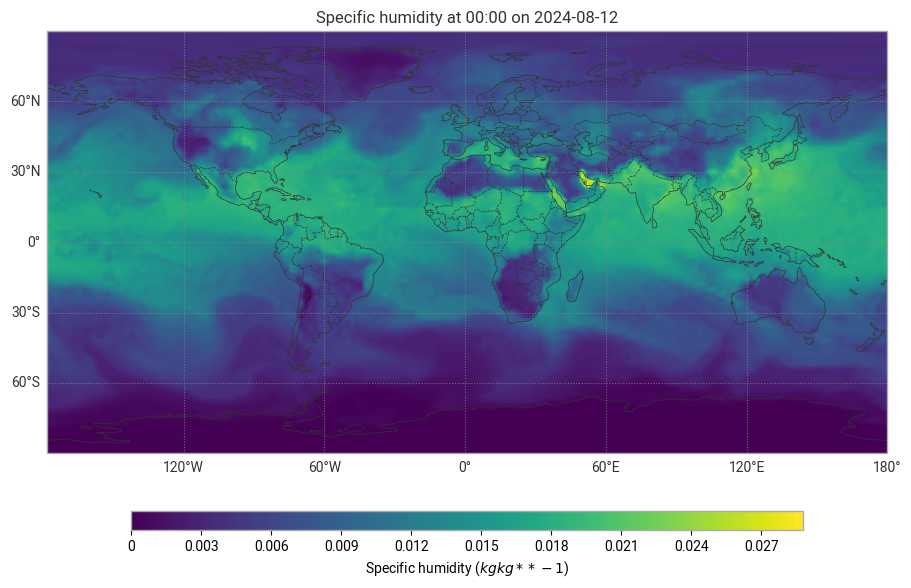

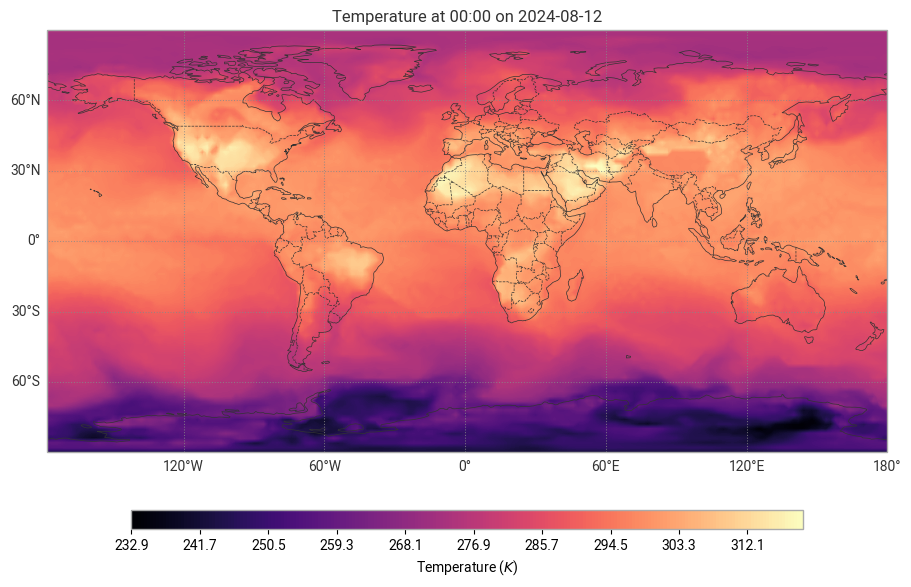

In [8]:
da_dict = {}
for i, d in enumerate(da):
    da_dict[da[i].name] = d
plot_data(da_dict)

## Comparing several different compression methods

### Run a Linear Quantization compressor

One of the codecs included in `fcbench.codecs` is the lossy `LinearQuantize` codec that rescales real-valued data from $[min; max]$ to the integer range $[0; 2^b - 1]$. Here, $b$ is the number of bit precision you want to keep. The compressor outputs an array of values of the smallest unsigned integer type that can represent values of $b$ bits, e.g. `u8`, `u16`, `u32`, or `u64`. If $b$ is not one of these powers of two, a lossless integer compressor can be added to further compress the data.

In [9]:
import numcodecs

In [10]:
linquant_compressor = []
da_linquant = {}
stats_linquant = {}

for i, d in enumerate(da):
    linquant_compressor.append([
        fcbench.codecs.LinearQuantize(bits=4, dtype=str(d.dtype)),
        fcbench.codecs.Zlib(level=4),
    ])
    da_linquant[d.name], stats_linquant[d.name] = (
        fcbench.compressor.compute_dataarray_compress_decompress(
            d, linquant_compressor[i]
        )
    )
    print(f"{da[i].long_name}" + ":")
    display(utils.format_compress_stats(linquant_compressor[i], stats_linquant[d.name]))

Specific humidity:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"LinearQuantize(dtype='f32', bits=4)",4.00,0.01,0.03,7.4,2.5
Zlib(level=4),5.03,0.00,0.00,32.2,7.5


Temperature:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"LinearQuantize(dtype='f32', bits=4)",4.0,0.02,0.03,7.4,2.5
Zlib(level=4),6.9,0.00,0.01,25.4,6.2


After you have finished using a compressor, it is important to overwrite or delete it to allow its resources to be reused.

In [11]:
del linquant_compressor

When we plot the compressed data, we can see that it has indeed been quantized to $2^4 = 16$ values (per data chunk).

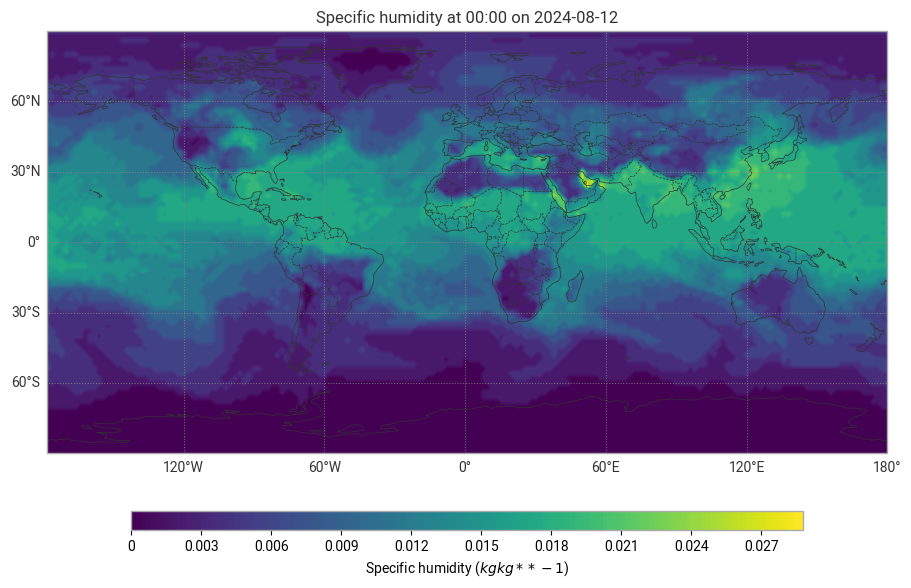

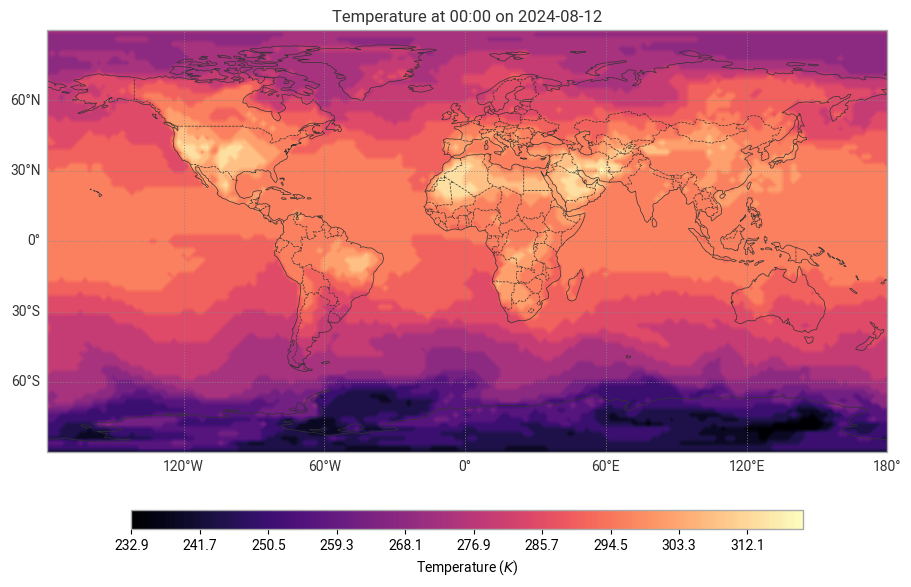

In [12]:
plot_data(da_linquant)

## Plot the Linear Quantization compression error

The following is a helper function to compute the different relative errors.

In [13]:
def compute_relative_errors(da_compressed, da):
    da_error = da_compressed - da

    norm_L1_error = np.abs(da_error).sum().values
    norm_L2_error = np.sqrt((da_error**2).sum().values)
    norm_Linf_error = np.abs(da_error).max().values

    norm_L1_original = np.abs(da).sum().values
    norm_L2_original = np.sqrt((da**2).sum().values)
    norm_Linf_original = np.abs(da).max().values

    relative_error_L1 = norm_L1_error / norm_L1_original
    relative_error_L2 = norm_L2_error / norm_L2_original
    relative_error_Linf = norm_Linf_error / norm_Linf_original

    return {
        "Relative_Error_L1": relative_error_L1,
        "Relative_Error_L2": relative_error_L2,
        "Relative_Error_Linf": relative_error_Linf,
    }

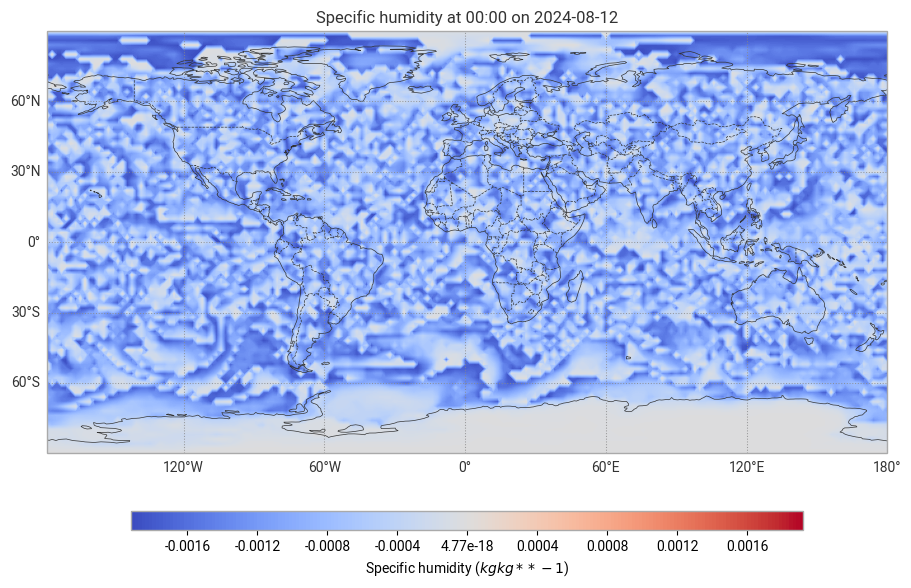

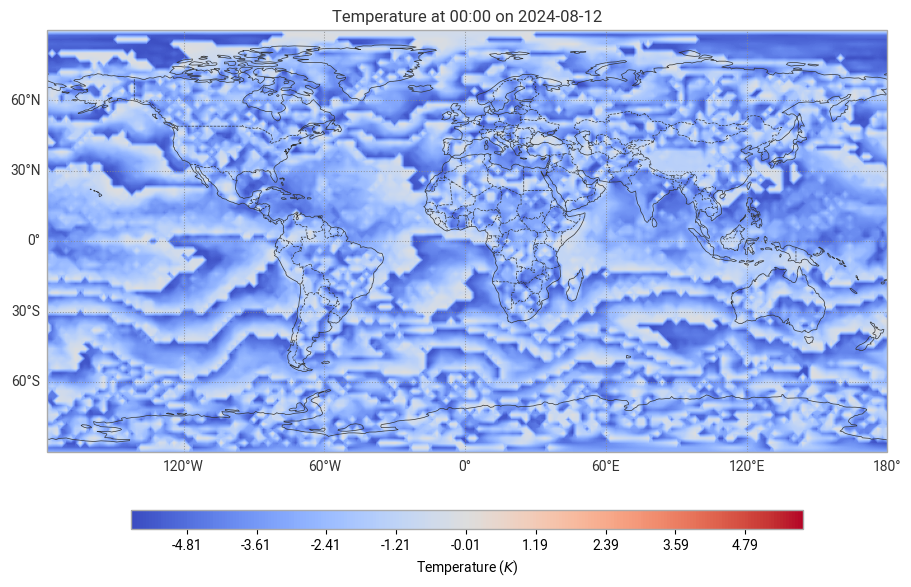

In [14]:
errors_linquant = {}
da_linquant_error = []
for i, d in enumerate(da):
    errors_linquant[d.name] = compute_relative_errors(da_linquant[d.name], da[i])
    with xr.set_options(keep_attrs=True):
        da_linquant_error = da_linquant[d.name] - da[i]
    earthkit.maps.quickplot(
        da_linquant_error,
        style=earthkit.maps.Style(
            colors="coolwarm",
            levels=earthkit.maps.styles.levels.auto_range(
                da_linquant_error, n_levels=256, divergence_point=0.0
            ),
        ),
    )

## Run the BitRound compressor

Bit rounding is a lossy in-place codec that removes false information from the least significant bits of the mantissa of a floating-point number. Measurement and simulation data often produces high precision numbers even though most of the trailing digits are made up of noise and uncertainty. The compression of such data can be aided by setting these bits to a constant value, which a downstream general-purpose compressor can then take advantage of. For bit rounding, the exessive bits are removed by rounding, though other approaches such as zeroing (bit shaving) or alternating between zeroing and setting to all-ones (bit grooming) exist as well.

The BitRound compressor is configured by the number of bits in the mantissa to keep, `keepbits`.

You can find out more about bit rounding, shaving, and grooming in the following publications:

> Caron, J. (2014). *Compression by bit shaving*. Available from: <http://www.unidata.ucar.edu/blogs/developer/entry/compression_by_bit_shaving> [Accessed: 02.10.2024].

> Klöwer, M., Razinger, M., Dominguez, J. J., Düben, P. D., & Palmer, T. N. (2021). Compressing atmospheric data into its real information content. *Nature Computational Science*. 1(11). pp. 713-724. Available from: [doi:10.1038/s43588-021-00156-2](https://doi.org/10.1038/s43588-021-00156-2).

> Zender, C. S. (2016). Bit grooming: statistically accurate precision-preserving quantization with compression, evaluated in the netcdf operators (nco,550 v4.4.8+). *Geoscientific Model Development*. 9(9). pp. 3199-3211. Available from: [doi:10.5194/gmd-9-3199-2016](https://doi.org/10.5194/gmd-9-3199-2016).

In [15]:
bitround_compressor = []
da_bitround = {}
stats_bitround = {}

for i, d in enumerate(da):
    bitround_compressor.append(
        [fcbench.codecs.BitRound(keepbits=6), fcbench.codecs.Zlib(level=9)]
    )
    da_bitround[d.name], stats_bitround[d.name] = (
        fcbench.compressor.compute_dataarray_compress_decompress(
            d, bitround_compressor[i]
        )
    )
    print(f"{da[i].long_name}" + ":")
    display(utils.format_compress_stats(bitround_compressor[i], stats_bitround[d.name]))

Specific humidity:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
BitRound(keepbits=6),1.0,0.03,0.03,0.3,0.1
Zlib(level=9),3.5,0.00,0.01,478.1,8.1


Temperature:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
BitRound(keepbits=6),1.00,0.03,0.04,0.3,0.1
Zlib(level=9),16.67,0.00,0.02,123.4,3.0


In [16]:
del bitround_compressor

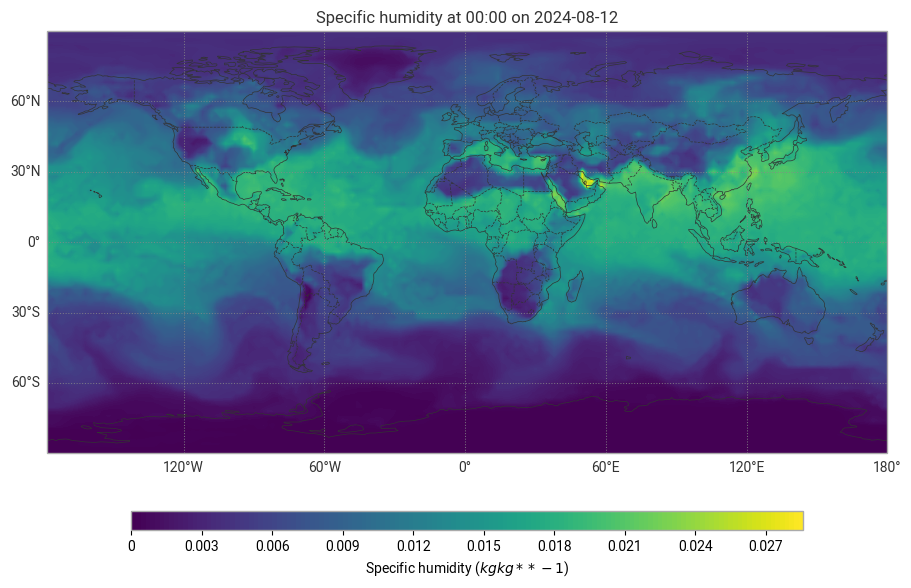

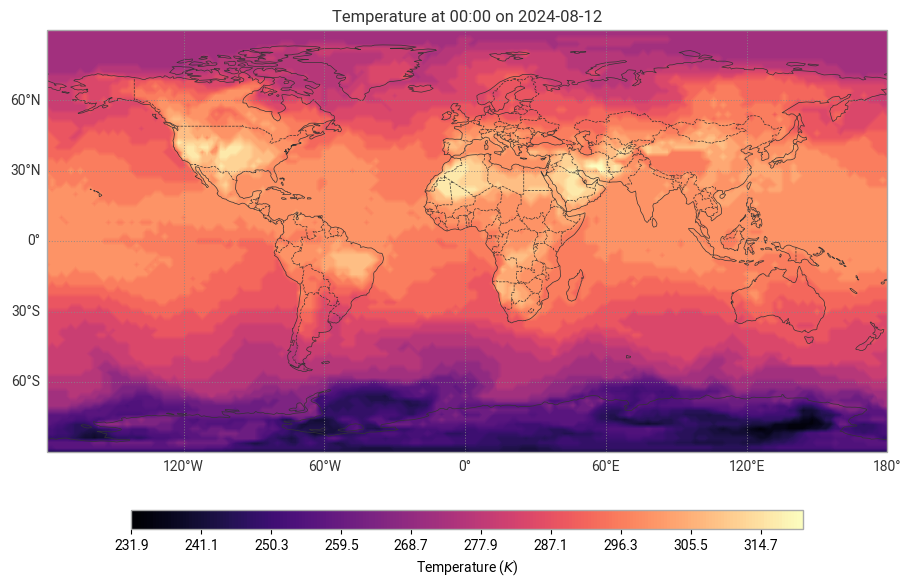

In [17]:
plot_data(da_bitround)

## Plot the BitRound compression error

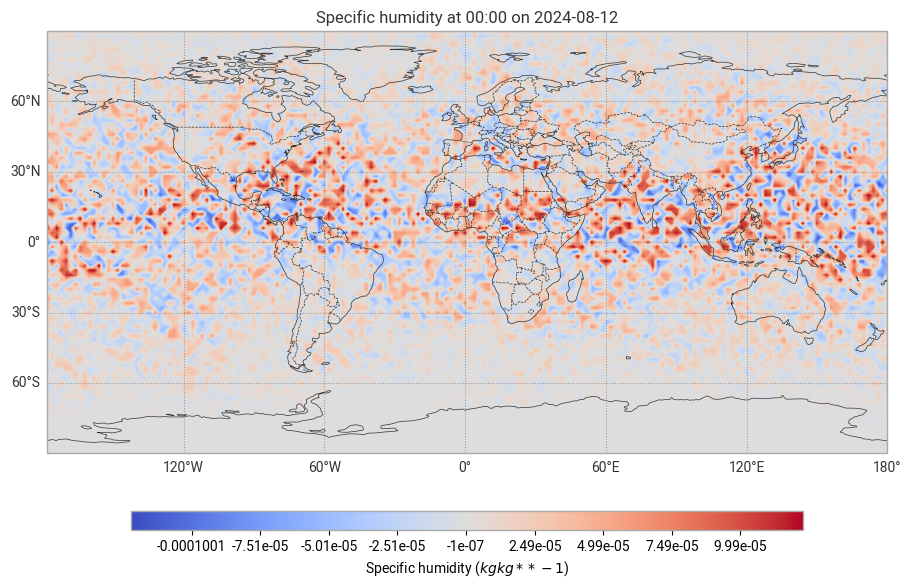

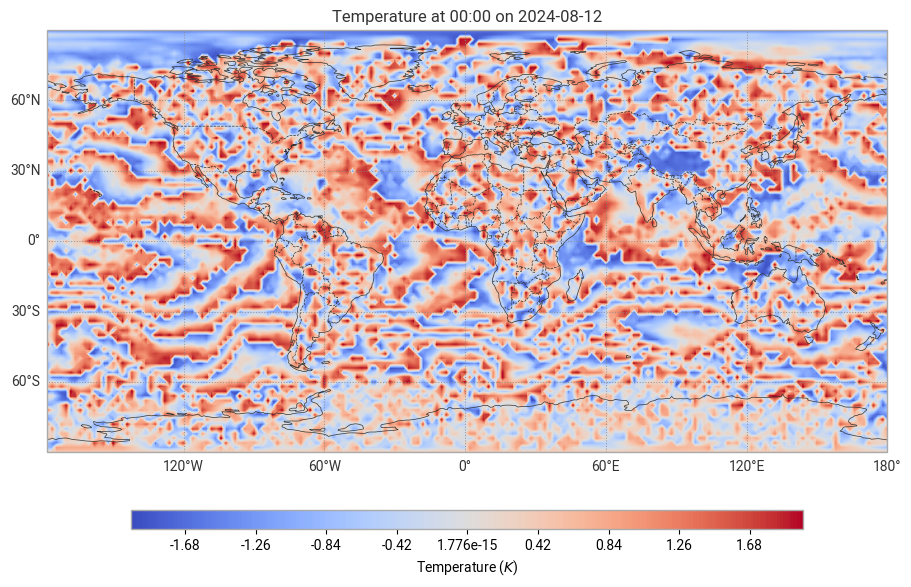

In [18]:
errors_bitround = {}
da_bitround_error = []
for i, d in enumerate(da):
    errors_bitround[d.name] = compute_relative_errors(da_bitround[d.name], da[i])
    with xr.set_options(keep_attrs=True):
        da_bitround_error = da_bitround[d.name] - da[i]
    earthkit.maps.quickplot(
        da_bitround_error,
        style=earthkit.maps.Style(
            colors="coolwarm",
            levels=earthkit.maps.styles.levels.auto_range(
                da_bitround_error, n_levels=256, divergence_point=0.0
            ),
        ),
    )

## Run the transform-based ZFP compressor

ZFP is a lossy transform-based compressor that compresses multidimensional data in $4^d$ chunks where $d$ is the dimensionality of the data. All values in the chunk are decorrelated and then transformed into a binary plane embedding that is roughly ordered by importance. The resulting per-chunk bitstream can be truncated to satisfy a user-provided compression target, e.g. a fixed number of bits, a bitplane precision, or an absolute error tolerance.

You can find out more about the ZFP compressor in its [documentation](https://zfp.readthedocs.io/en/latest/index.html) and the following two publications:

> Diffenderfer, J. et *al*. (2019). Error Analysis of ZFP Compression for Floating-Point Data. *SIAM Journal on Scientific Computing*. 41(3). pp. A1867-A1898. Available from: [doi:10.1137/18M1168832](https://doi.org/10.1137/18M1168832).

> Lindstrom, P. (2014). Fixed-Rate Compressed Floating-Point Arrays. *IEEE Transactions on Visualization and Computer Graphics*. 20(2). pp. 2674-2683. Available from: [doi:10.1109/TVCG.2014.2346458](https://doi.org/10.1109/TVCG.2014.2346458).

In [19]:
zfp_compressor = []
da_zfp = {}
stats_zfp = {}

for i, d in enumerate(da):
    zfp_compressor.append(
        [
            fcbench.codecs.Log(),
            fcbench.codecs.Zfp(mode="fixed-accuracy", tolerance=1e-3),
        ]
    )
    da_zfp[d.name], stats_zfp[d.name] = (
        fcbench.compressor.compute_dataarray_compress_decompress(
            d, zfp_compressor[i]
        )
    )
    print(f"{da[i].long_name}" + ":")
    display(
        utils.format_compress_stats(zfp_compressor[i], stats_zfp[d.name])
    )

Specific humidity:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
Log(),1.00,0.02,0.02,2.3,4.3
"Zfp(mode='fixed-accuracy', tolerance=0.001)",0.75,0.01,0.00,24.6,21.6


Temperature:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
Log(),1.00,0.02,0.02,2.3,4.3
"Zfp(mode='fixed-accuracy', tolerance=0.001)",1.17,0.01,0.01,24.4,18.1


In [20]:
del zfp_compressor

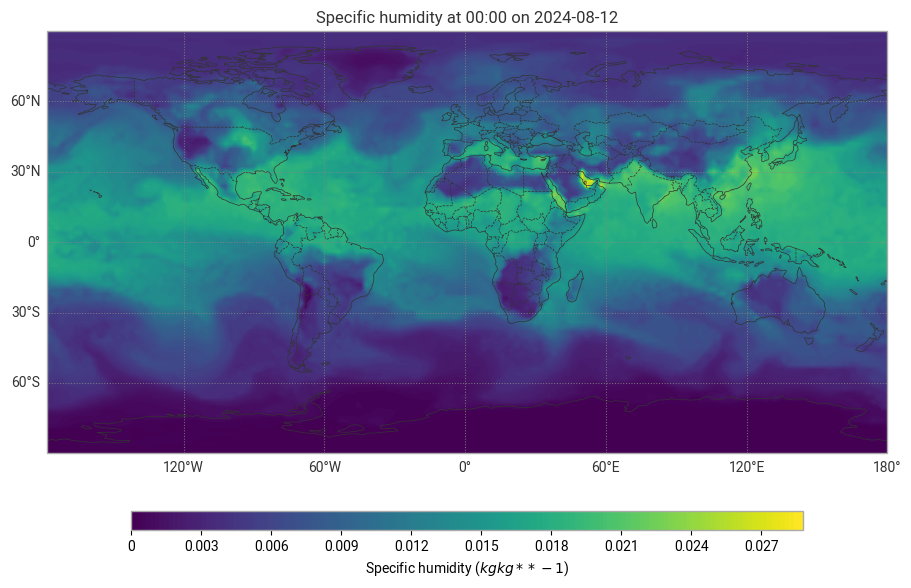

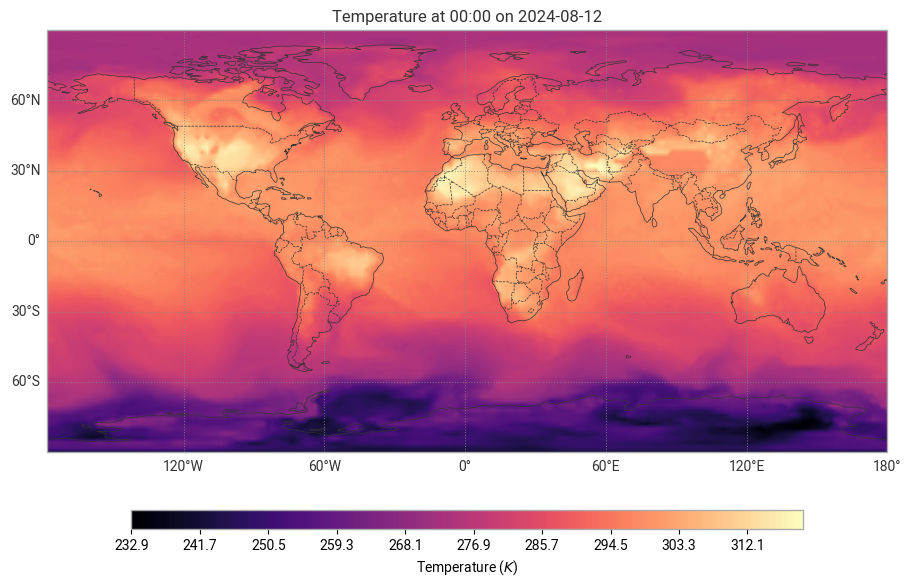

In [21]:
plot_data(da_zfp)

## Plot the ZFP compression error

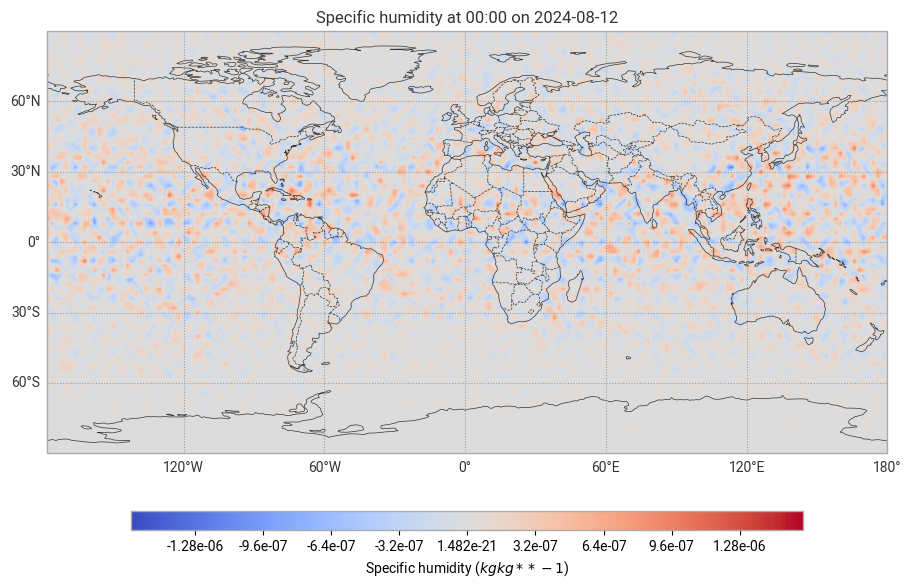

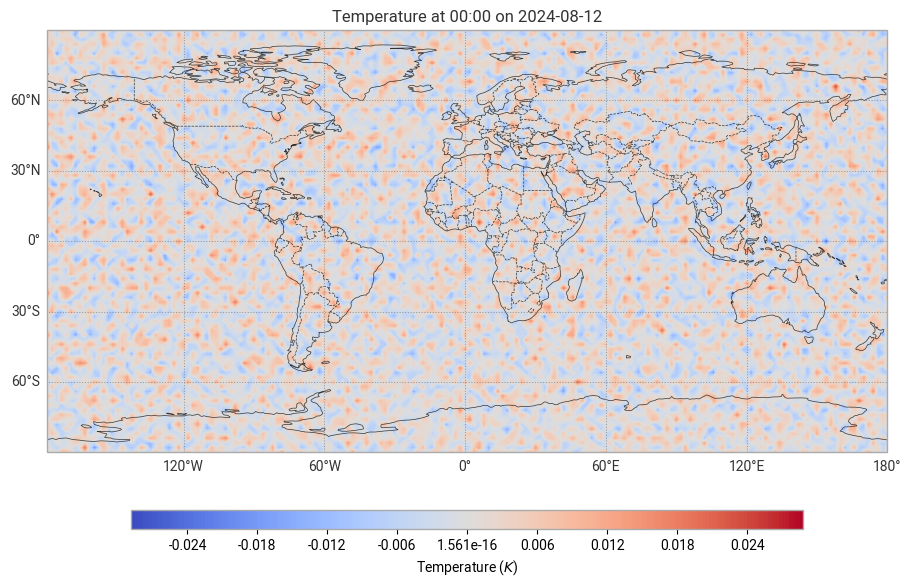

In [22]:
errors_zfp = {}
da_zfp_error = []
for i, d in enumerate(da):
    errors_zfp[d.name] = compute_relative_errors(da_zfp[d.name], da[i])
    with xr.set_options(keep_attrs=True):
        da_zfp_error = da_zfp[d.name] - da[i]
    earthkit.maps.quickplot(
        da_zfp_error,
        style=earthkit.maps.Style(
            colors="coolwarm",
            levels=earthkit.maps.styles.levels.auto_range(
                da_zfp_error, n_levels=256, divergence_point=0.0
            ),
        ),
    )

## Run the prediction-based SZ3 compressor

SZ3 is a lossy prediction-based compressor that compresses multidimensional data by predicting the next value based on an indentified pattern. The quantized prediction errors are stored alongside the pattern. SZ3 is a modular compression pipeline that combines a data preprocessor, predictor, quantizer, encoder, and lossless compressor. The compression error can be bounded with absolute, relative, and PWR error bounds.

You can find out more about the SZ3 compressor in the following publications:

> Liang, X. et *al*. (2023). SZ3: A modular framework for composing prediction-based error-bounded lossy compressors. *IEEE Transactions on Big Data*. 9(2). pp. 485-498. Available from: [doi:10.1109/TBDATA.2022.3201176](https://doi.org/10.1109/TBDATA.2022.3201176).

> Zhao, K. et *al*. (2021). Optimizing Error-Bounded Lossy Compression for Scientiﬁc Data by Dynamic Spline Interpolation. In: *Proceeding of the 37th IEEE International Conference on Data Engineering*. pp. 1643-1654. Available from: [doi:10.1109/ICDE51399.2021.00145](https://doi.org/10.1109/ICDE51399.2021.00145).

> Liang, X. et *al*. (2018). Error-Controlled Lossy Compression Optimized for High Compression Ratios of Scientific Datasets. *IEEE International Conference on Big Data*. pp. 438-447. Available from: [doi:10.1109/BigData.2018.8622520](https://doi.org/10.1109/BigData.2018.8622520).

In [23]:
sz3_compressor = []
da_sz3 = {}
stats_sz3 = {}

for i, d in enumerate(da):
    sz3_compressor.append([fcbench.codecs.Sz3(eb_mode="rel", eb_rel=1e-3)])
    da_sz3[d.name], stats_sz3[d.name] = (
        fcbench.compressor.compute_dataarray_compress_decompress(
            d, sz3_compressor[i]
        )
    )
    print(f"{da[i].long_name}" + ":")
    display(utils.format_compress_stats(sz3_compressor[i], stats_sz3[d.name]))

Specific humidity:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"Sz3(eb_mode='rel', eb_rel=0.001)",4.69,0.01,0.03,16.1,5.6


Temperature:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"Sz3(eb_mode='rel', eb_rel=0.001)",5.45,0.02,0.04,15.8,5.2


In [24]:
del sz3_compressor

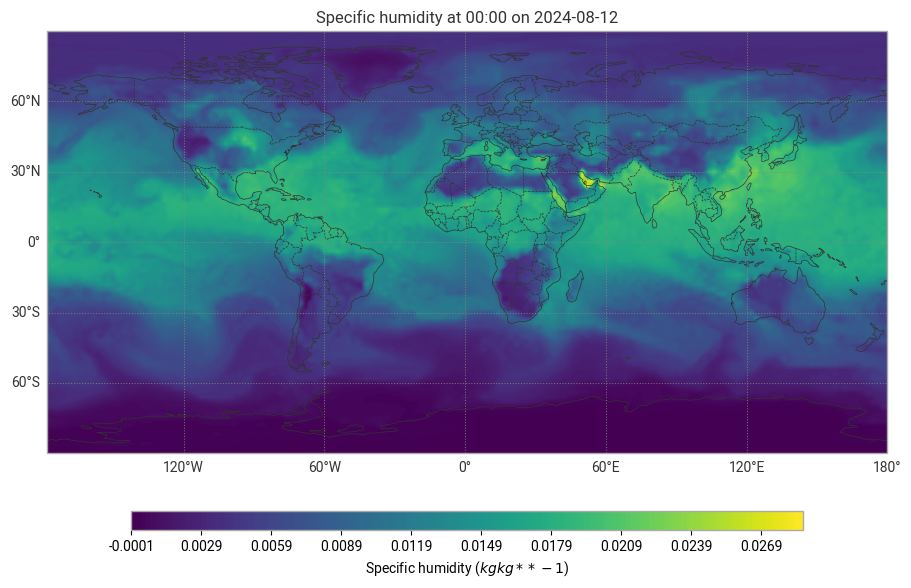

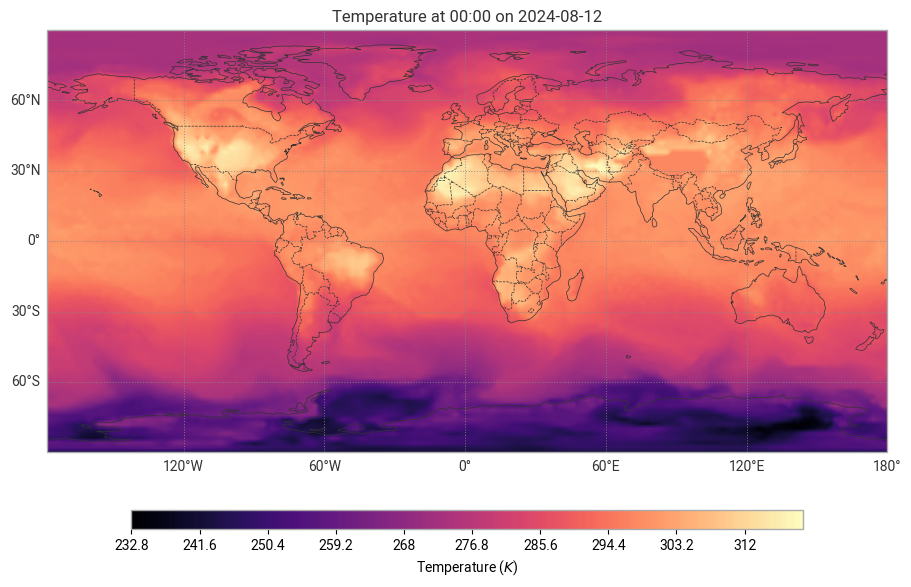

In [25]:
plot_data(da_sz3)

## Plot the SZ3 compression error

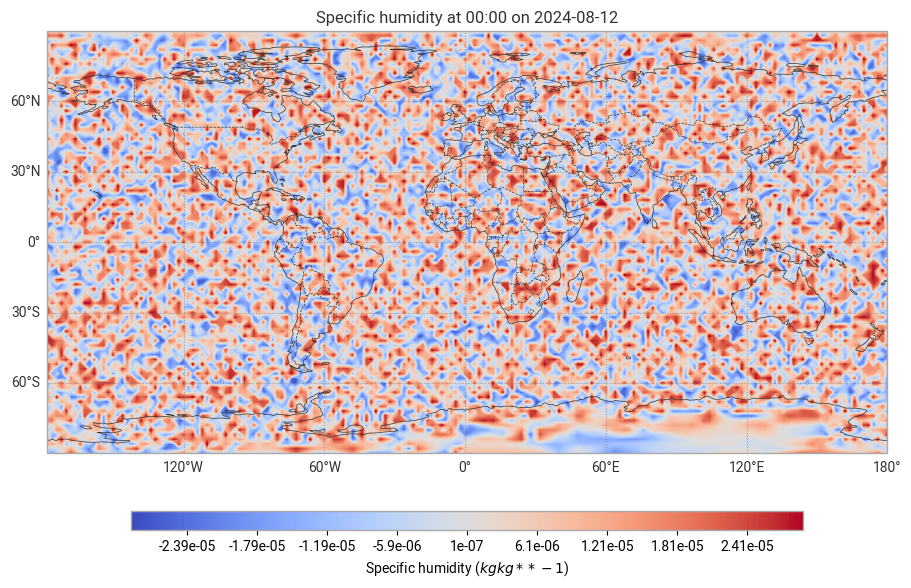

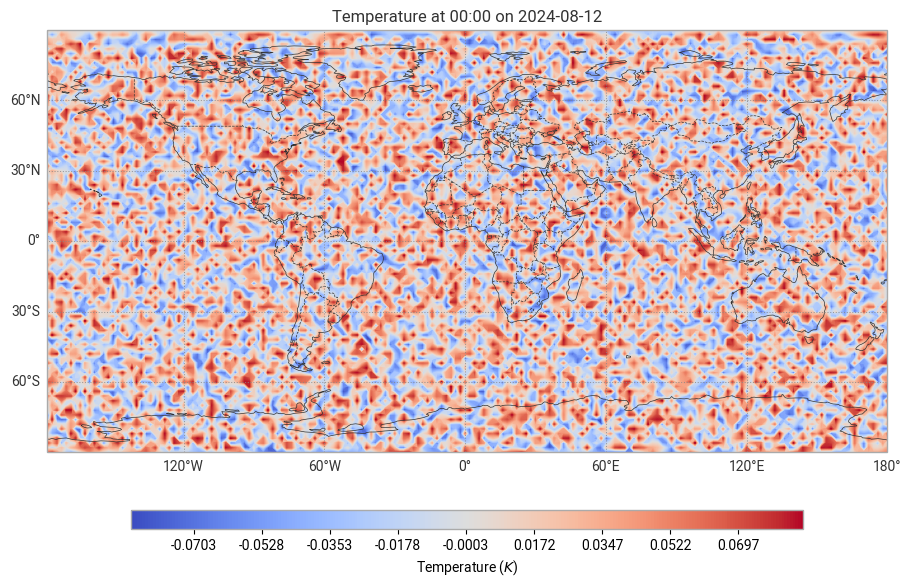

In [26]:
errors_sz3 = {}
da_sz3_error = []
for i, d in enumerate(da):
    errors_sz3[d.name] = compute_relative_errors(da_sz3[d.name], da[i])
    with xr.set_options(keep_attrs=True):
        da_sz3_error = da_sz3[d.name] - da[i]
    earthkit.maps.quickplot(
        da_sz3_error,
        style=earthkit.maps.Style(
            colors="coolwarm",
            levels=earthkit.maps.styles.levels.auto_range(
                da_sz3_error, n_levels=256, divergence_point=0.0
            ),
        ),
    )

## Overview 

Here you get an overview table showing the used compressors, compression factors and resulting $L^1$, $L^2$ and $L^\infty$ errors.

In [27]:
data = []

compressors = {
    "Linear Quantization": (errors_linquant, stats_linquant),
    "Bit Rounding": (errors_bitround, stats_bitround),
    "ZFP": (errors_zfp, stats_zfp),
    "SZ3": (errors_sz3, stats_sz3),
}

for compressor_name, (errors, stats) in compressors.items():
    for variable, error_data in errors.items():
        row = {
            "Compressor": compressor_name,
            "Variable": variable,
            "Compression Ratio [raw B / enc B]": round(
                stats[variable][0].decoded_bytes / stats[variable][-1].encoded_bytes,
                2,
            ),
            "L1 Error": error_data.get("Relative_Error_L1", None),
            "L2 Error": error_data.get("Relative_Error_L2", None),
            "Linf Error": error_data.get("Relative_Error_Linf", None),
            "Encode Instructions [# / raw B]": round(
                sum(s.encode_instructions for s in stats[variable])
                / stats[variable][0].decoded_bytes,
                1,
            ),
            "Decode Instructions [# / raw B]": round(
                sum(s.decode_instructions for s in stats[variable])
                / stats[variable][0].decoded_bytes,
                1,
            ),
            "Encode Throughput [raw GB / s]": round(
                1e-9
                * stats[variable][0].decoded_bytes
                / sum(
                    s.encode_timing.secs + s.encode_timing.nanos * 1e-9
                    for s in stats[variable]
                ),
                2,
            ),
            "Decode Throughput [raw GB / s]": round(
                1e-9
                * stats[variable][0].decoded_bytes
                / sum(
                    s.decode_timing.secs + s.decode_timing.nanos * 1e-9
                    for s in stats[variable]
                ),
                2,
            ),
        }
        data.append(row)


df = pd.DataFrame(data)
df

,Compressor,Variable,Compression Ratio [raw B / enc B],L1 Error,L2 Error,Linf Error,Encode Instructions [# / raw B],Decode Instructions [# / raw B],Encode Throughput [raw GB / s],Decode Throughput [raw GB / s]
0,Linear Quantization,q,20.11,0.106066,0.104129,0.066659,15.4,4.4,0.00,0.01
1,Linear Quantization,t,27.56,0.010222,0.011751,0.018030,13.7,4.1,0.01,0.01
2,Bit Rounding,q,3.50,0.002944,0.003563,0.004255,478.3,8.2,0.00,0.01
3,Bit Rounding,t,16.67,0.003308,0.003879,0.006264,123.7,3.0,0.00,0.01
4,ZFP,q,0.75,0.000017,0.000021,0.000055,26.8,25.9,0.00,0.00
5,ZFP,t,1.17,0.000017,0.000021,0.000090,26.7,22.4,0.00,0.01
6,SZ3,q,4.69,0.001642,0.001558,0.001000,16.1,5.6,0.01,0.03
7,SZ3,t,5.45,0.000146,0.000170,0.000270,15.8,5.2,0.02,0.04
